# 03 — Check the built tiles

Testing if the boxes sit on cars across scenes (not just Vaihingen), dense rows are sane, val labels look right, background tiles are empty.

Testing every image has a label file, every label line is valid YOLO (coords in [0,1], no edge overflow), and **no scene leaks across train/val**.

In [1]:
import sys
import random
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

PROJECT_ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
sys.path.append(str(PROJECT_ROOT))

PROCESSED = PROJECT_ROOT / "data/cowc/processed"
TILE_SIZE = 640        # tiles are square; labels are normalised to this

### Helpers (label reader + tile finders)

In [2]:
def read_yolo_label(label_path: Path, tile_size: int = TILE_SIZE):
    """Return [(x1, y1, x2, y2), ...] pixel boxes from a YOLO .txt (empty -> [])."""
    boxes = []
    if not label_path.exists():
        return boxes
    for line in label_path.read_text().splitlines():
        if not line.strip():
            continue
        _, cx, cy, w, h = map(float, line.split())
        cx, cy, w, h = cx*tile_size, cy*tile_size, w*tile_size, h*tile_size
        boxes.append((cx - w/2, cy - h/2, cx + w/2, cy + h/2))
    return boxes


def tile_paths(split: str):
    """(image_path, label_path) pairs for a split, image and label matched by stem."""
    img_dir = PROCESSED / "images" / split
    lbl_dir = PROCESSED / "labels" / split
    pairs = []
    for img in sorted(img_dir.glob("*.png")):
        pairs.append((img, lbl_dir / f"{img.stem}.txt"))
    return pairs


def scene_of(path: Path) -> str:
    """Recover the scene name from a tile filename (scene__x..._y...)."""
    return path.stem.split("__")[0]

In [3]:
def show_tile(img_path: Path, lbl_path: Path, ax=None, zoom=None):
    """Draw a tile with its YOLO boxes. zoom=(x, y, size) crops in to judge fit."""
    img = np.asarray(Image.open(img_path).convert("RGB"))
    boxes = read_yolo_label(lbl_path)
    if ax is None:
        _, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(img)
    for (x1, y1, x2, y2) in boxes:
        ax.add_patch(patches.Rectangle((x1, y1), x2-x1, y2-y1,
                     linewidth=1.0, edgecolor="lime", facecolor="none"))
    if zoom:
        zx, zy, zs = zoom
        ax.set_xlim(zx, zx+zs); ax.set_ylim(zy+zs, zy)
    ax.set_title(f"{scene_of(img_path)}  ({len(boxes)} cars)", fontsize=8)
    ax.axis("off")
    return ax


def densest_tiles(split: str, n: int = 6):
    """The n tiles with the most boxes -- dense rows are the hard visual test."""
    scored = [(i, l, len(read_yolo_label(l))) for i, l in tile_paths(split)]
    scored = [s for s in scored if s[2] > 0]
    scored.sort(key=lambda t: -t[2])
    return [(i, l) for i, l, _ in scored[:n]]

### 1) Densest train tiles

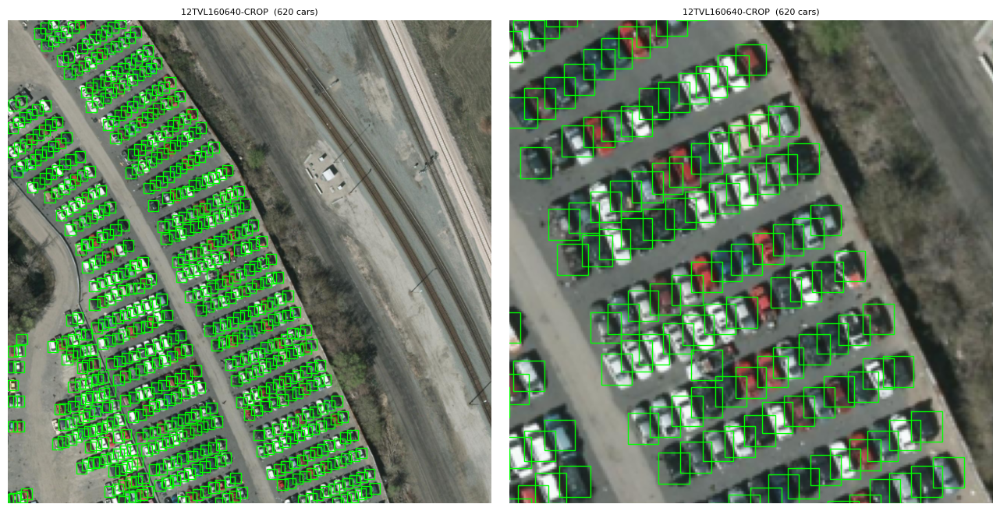

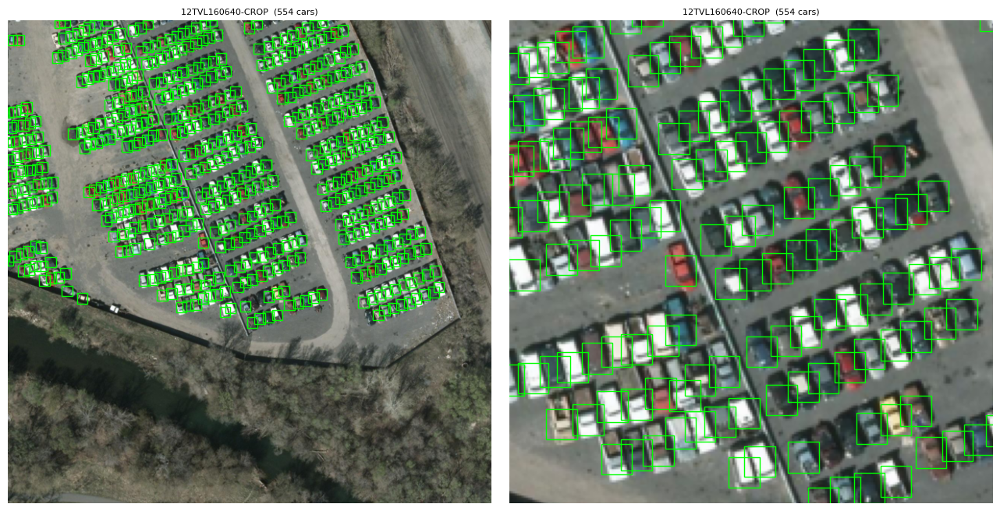

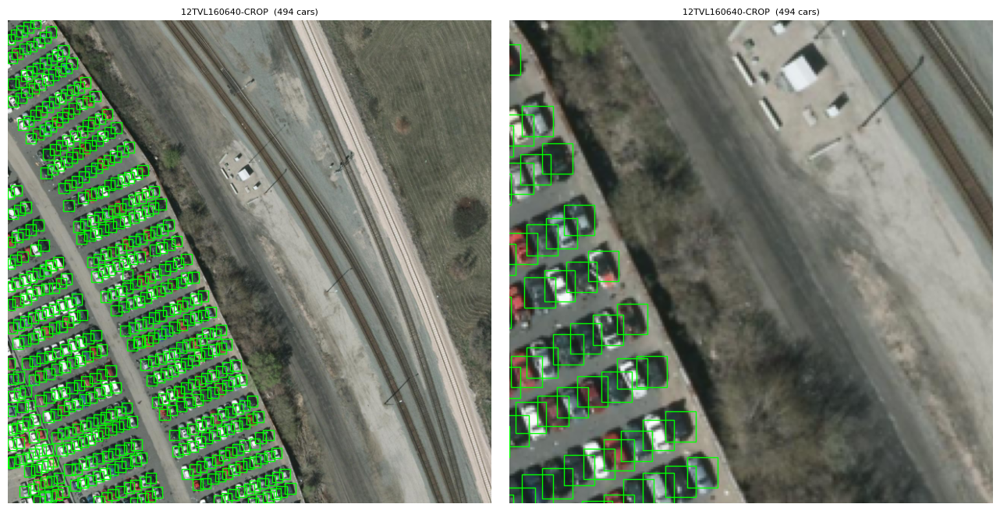

In [4]:
# 1) The hard test: the densest train tiles, full + zoom side by side.
for img, lbl in densest_tiles("train", n=3):
    fig, (a, b) = plt.subplots(1, 2, figsize=(13, 6.5))
    show_tile(img, lbl, ax=a)
    show_tile(img, lbl, ax=b, zoom=(180, 180, 220))   # move the window onto a cluster
    plt.tight_layout(); plt.show()

### 2) Val tiles 

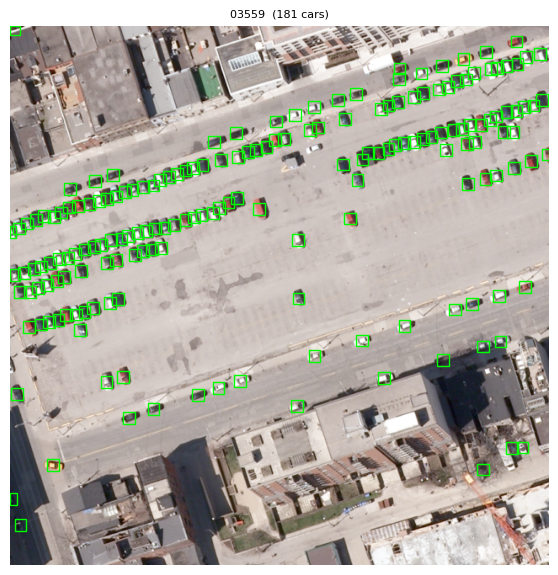

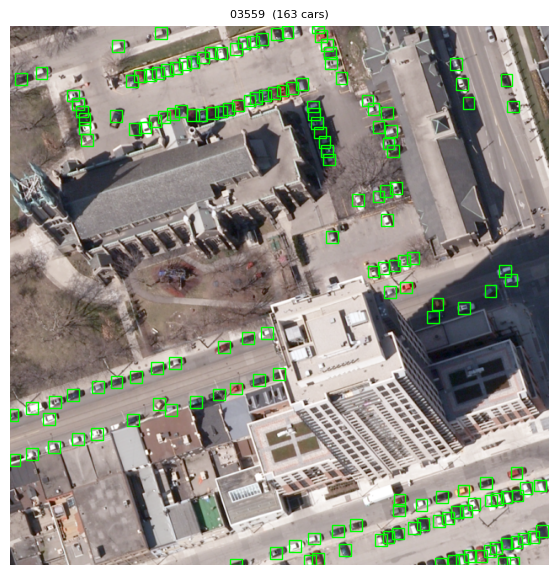

In [5]:
# 2) Val tiles (the held-out 03559 scene) -- the labels the model is judged on.
for img, lbl in densest_tiles("val", n=2):
    show_tile(img, lbl)
    plt.show()

### 3) Random spread 

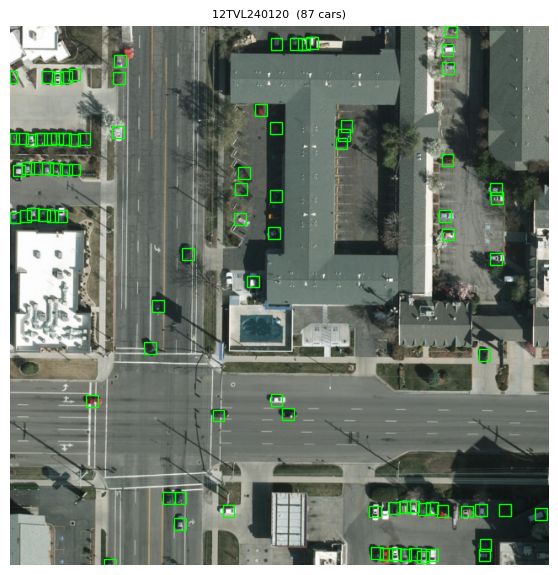

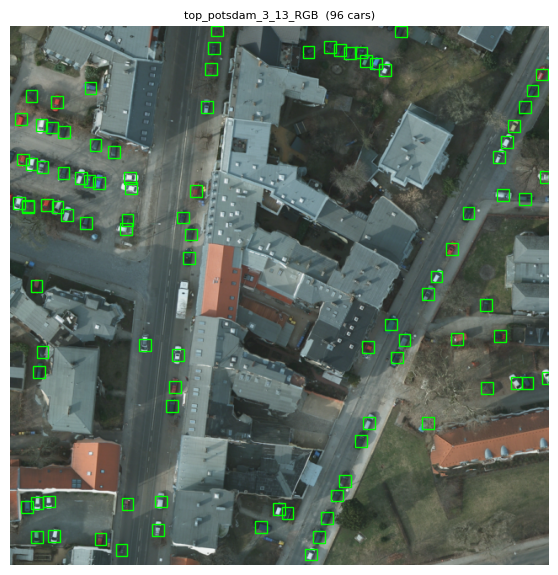

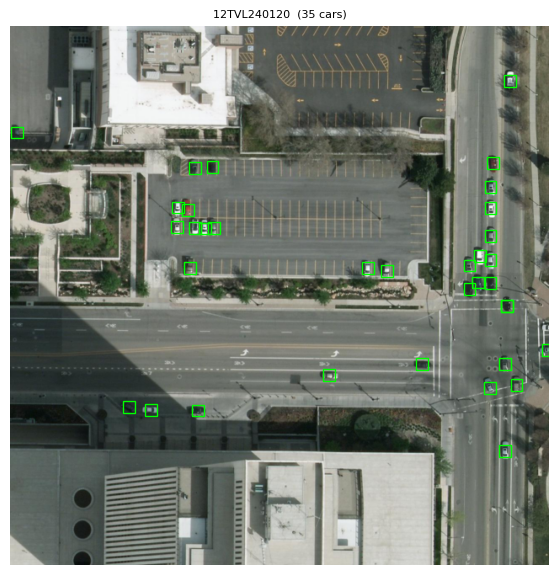

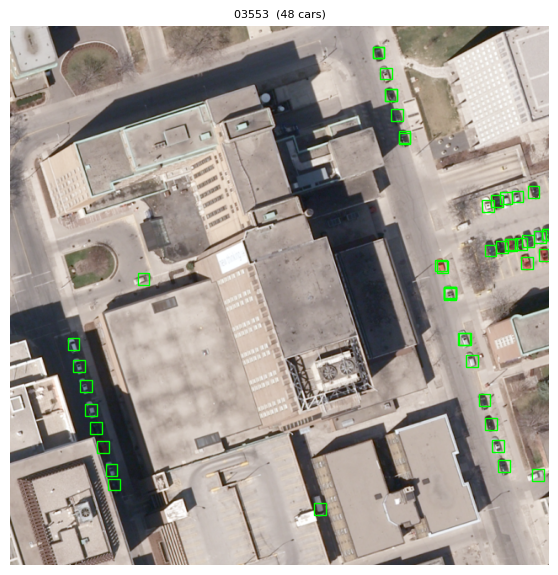

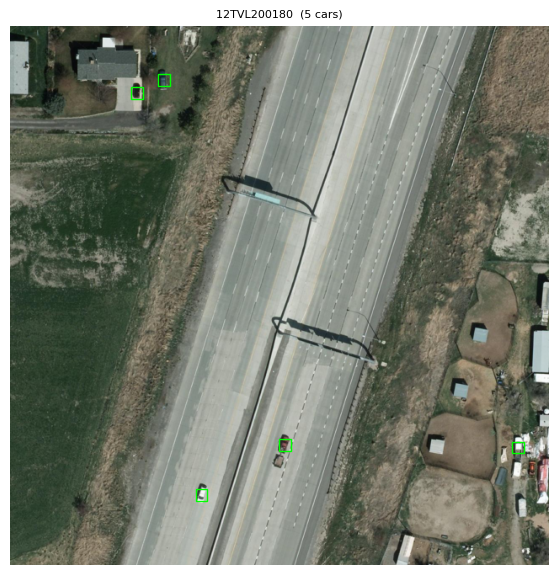

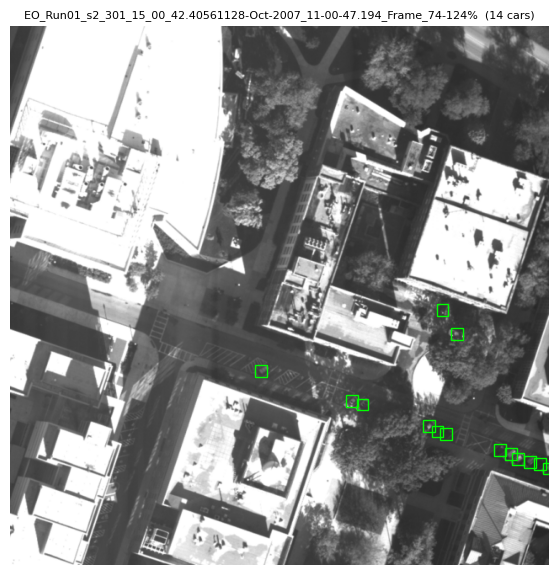

In [6]:
# 3) A random spread across scenes -- catches a scene whose labels look wrong.
pairs = [p for p in tile_paths("train") if len(read_yolo_label(p[1])) > 0]
for img, lbl in random.Random(0).sample(pairs, k=min(6, len(pairs))):
    show_tile(img, lbl)
    plt.show()

### 4) A hard-negative tile 

empty (background/hard-neg) train tiles: 1219


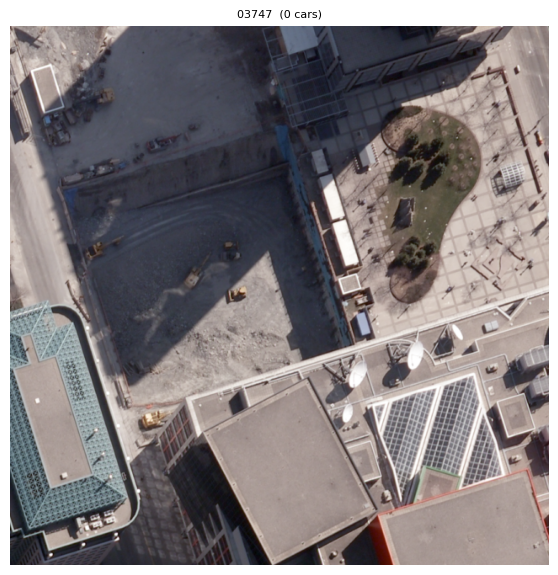

In [7]:
# 4) Confirm a hard-negative / background tile is genuinely empty (no boxes).
empties = [(i, l) for i, l in tile_paths("train") if len(read_yolo_label(l)) == 0]
print(f"empty (background/hard-neg) train tiles: {len(empties)}")
if empties:
    show_tile(*empties[0]); plt.show()

### 5) Dataset integrity + leakage guard (non-visual, runs over everything)

In [8]:
# 5) Non-visual integrity checks across the whole built dataset.
def integrity(split: str):
    pairs = tile_paths(split)
    missing_lbl = [i.name for i, l in pairs if not l.exists()]
    bad = []
    for _, l in pairs:
        for line in (l.read_text().splitlines() if l.exists() else []):
            if not line.strip():
                continue
            vals = line.split()
            if len(vals) != 5:
                bad.append((l.name, "wrong field count")); continue
            _, cx, cy, w, h = map(float, vals)
            if not all(0 <= v <= 1 for v in (cx, cy, w, h)) or cx+w/2 > 1.0001 or cy+h/2 > 1.0001:
                bad.append((l.name, line))
    scenes = sorted({scene_of(i) for i, _ in pairs})
    return len(pairs), missing_lbl, bad, scenes

for split in ("train", "val"):
    n, missing, bad, scenes = integrity(split)
    print(f"\n[{split}] tiles={n}  scenes={len(scenes)}")
    print(f"   images missing a label file: {len(missing)}")
    print(f"   invalid label lines: {len(bad)}")
    if bad[:3]: print("   e.g.", bad[:3])

# Leakage guard: no scene may appear in BOTH train and val.
train_scenes = {scene_of(i) for i, _ in tile_paths("train")}
val_scenes   = {scene_of(i) for i, _ in tile_paths("val")}
leak = train_scenes & val_scenes
print(f"\nscenes in BOTH train and val (must be empty): {sorted(leak)}")
assert not leak, "LEAKAGE: a scene appears in both splits!"
print("No leakage - scene-level split intact.")


[train] tiles=2822  scenes=31
   images missing a label file: 0
   invalid label lines: 0

[val] tiles=126  scenes=1
   images missing a label file: 0
   invalid label lines: 0

scenes in BOTH train and val (must be empty): []
No leakage - scene-level split intact.
